# Taller de Visualización
**Nombre:** Juan Manuel Gutiérrez Gómez  **Código:** 2260563

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

In [25]:
df = pd.read_csv('Measurement_summary.csv')
df.head()

,Measurement date,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01 00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.059,0.002,1.2,73.0,57.0
1,2017-01-01 01:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.058,0.002,1.2,71.0,59.0
2,2017-01-01 02:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,59.0
3,2017-01-01 03:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,58.0
4,2017-01-01 04:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.003,0.051,0.002,1.2,69.0,61.0


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 647511 entries, 0 to 647510
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Measurement date  647511 non-null  object 
 1   Station code      647511 non-null  int64  
 2   Address           647511 non-null  object 
 3   Latitude          647511 non-null  float64
 4   Longitude         647511 non-null  float64
 5   SO2               647511 non-null  float64
 6   NO2               647511 non-null  float64
 7   O3                647511 non-null  float64
 8   CO                647511 non-null  float64
 9   PM10              647511 non-null  float64
 10  PM2.5             647511 non-null  float64
dtypes: float64(8), int64(1), object(2)
memory usage: 54.3+ MB


In [27]:
df['Station code'].nunique()

25

In [28]:
list_scode = list(set(df['Station code']))
list_scode

[101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125]

## Preprocesar Datos

Del 101 al 125, los códigos de estación representan los distritos de Seúl. Personalmente, usar los nombres de los distritos es más conveniente para etiquetar la visualización, ya que es más conveniente para leer. Los nombres se extraerán de la columna 'Dirección' para crear la columna 'Distrito'.

In [29]:
list_add = list(df['Address'])
District = [i.split(', ')[2] for i in list_add]
df['District'] = District

Cree una lista con los nombres de los 25 distritos para usarla más adelante.

In [30]:
list_district = list(set(District))

Se crean otras tres columnas, YM (Año-Mes), Año y Mes para aplicar con algunos gráficos. Para facilitar la visualización, los agruparemos en DataFrame mensual promedio.

In [31]:
list_YM = [i.split(" ")[0][:-3] for i in  list(df['Measurement date'])]
list_Year = [i.split(" ")[0][0:4] for i in  list(df['Measurement date'])]
list_Month = [i.split(" ")[0][5:7] for i in  list(df['Measurement date'])]

df['YM'] = list_YM
df['Year'] = list_Year
df['Month'] = list_Month

#create a monthly dataframe
df_monthly = df.groupby(['Station code', 'District', 'YM', 'Year', 'Month']).mean()
df_monthly = df_monthly[['SO2', 'NO2', 'O3', 'CO', 'PM10', 'PM2.5']].reset_index()

df_monthly.head()

,Station code,District,YM,Year,Month,SO2,NO2,O3,CO,PM10,PM2.5
0,101,Jongno-gu,2017-01,2017,01,0.004401,0.037481,0.014972,0.695968,51.024194,35.118280
1,101,Jongno-gu,2017-02,2017,02,-0.022152,0.010290,-0.008138,0.600000,41.970238,28.857143
2,101,Jongno-gu,2017-03,2017,03,0.005015,0.041267,0.026862,0.698118,55.146505,40.311828
3,101,Jongno-gu,2017-04,2017,04,0.003308,0.034699,0.033512,0.598056,50.769444,26.536111
4,101,Jongno-gu,2017-05,2017,05,0.003461,0.031724,0.039319,0.490591,55.129032,22.680108


## Plot de Datos

Gráfico de series temporales múltiples.

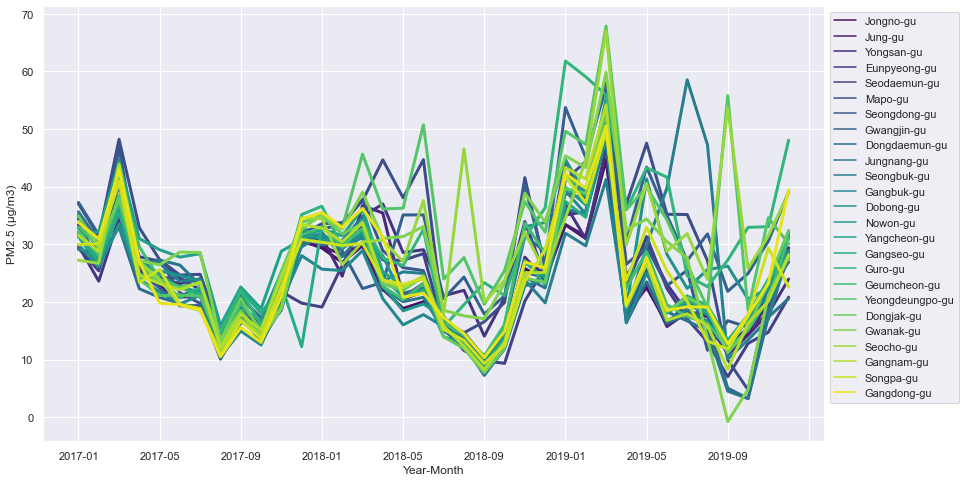

In [9]:
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(14,8)})

ax = sns.lineplot(data=df_monthly, x ='YM', y = 'PM2.5',
                  hue='District', palette='viridis',
                  legend='full', lw=3)

ax.xaxis.set_major_locator(ticker.MultipleLocator(4))
plt.legend(bbox_to_anchor=(1, 1))
plt.ylabel('PM2.5 (µg/m3)')
plt.xlabel('Year-Month')
plt.show()

Las líneas superpuestas son difíciles de leer. En 2017, se puede ver que la cantidad de PM2.5 en muchas estaciones fue en la misma dirección. Sin embargo, en 2018 y 2019, las líneas de contaminación fueron arbitrarias y es difícil distinguirlas.

## Gráfico Interactivo

Plotly es una biblioteca gráfica para hacer gráficos interactivos. El gráfico interactivo ayuda a acercar el área con líneas superpuestas.

In [10]:
import plotly.graph_objects as go

pal = list(sns.color_palette(palette='viridis', n_colors=len(list_scode)).as_hex())

fig = go.Figure()
for d,p in zip(list_district, pal):
    fig.add_trace(go.Scatter(x = df_monthly[df_monthly['District']==d]['YM'],
                             y = df_monthly[df_monthly['District']==d]['PM2.5'],
                             name = d,
                             line_color = p, 
                             fill=None))   #tozeroy 

fig.show()

Con Plotly, también se puede hacer un gráfico de área interactivo.

In [11]:
fig = go.Figure()
for d,p in zip(list_district, pal):
    fig.add_trace(go.Scatter(x = df_monthly[df_monthly['District']==d]['YM'],
                             y = df_monthly[df_monthly['District']==d]['PM2.5'],
                             name = d,
                             line_color = p, 
                             fill='tozeroy'))   #tozeroy 

fig.show()

## Cambiar el punto de vista con Facet Grid

FacetGrid de Seaborn se puede utilizar para crear cuadrículas de varias parcelas. En este caso, los atributos 'Mes' y 'Año' se configuran como filas y columnas, respectivamente. Desde otra perspectiva, los valores se pueden comparar simultáneamente mensualmente en vertical y anualmente en horizontal.

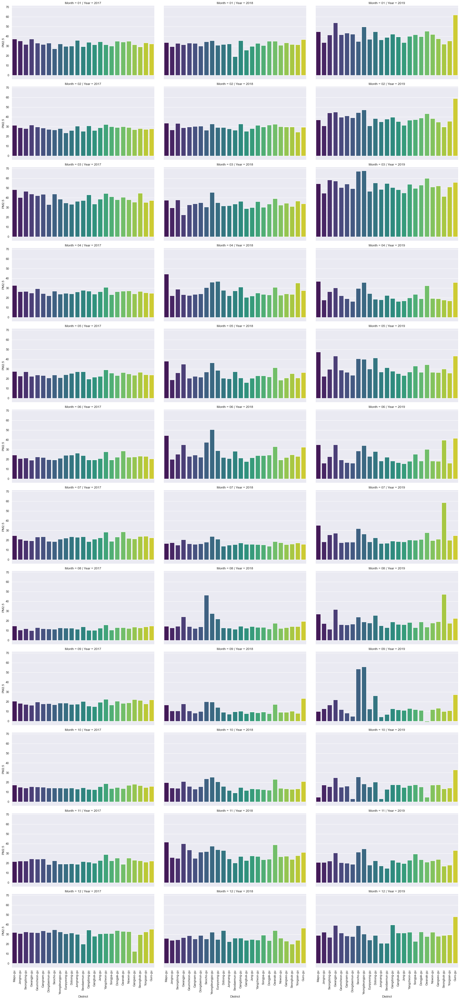

In [12]:
g = sns.FacetGrid(df_monthly, col="Year", row="Month", height=4.2, aspect=1.9)
g = g.map(sns.barplot, 'District', 'PM2.5', palette='viridis', ci=None, order = list_district)

g.set_xticklabels(rotation = 90)
plt.show()

## Uso del color con mapa de calor

Un mapa de calor representa los datos en un gráfico bidimensional que muestra los valores en colores. Para manejar los datos de la serie temporal, podemos configurar los grupos en la vertical y la línea de tiempo en las dimensiones horizontales. La diferencia de color ayuda a distinguir entre grupos.

Pivotar el marco de datos

In [13]:
df_pivot = pd.pivot_table(df_monthly,
                          values='PM2.5',
                          index='District',
                          columns='YM')
df_pivot

YM,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,...,2019-03,2019-04,2019-05,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12
District,,,,,,,,,,,,,,,,,,,,,
Dobong-gu,29.938172,26.101190,33.245968,24.245833,25.389785,24.570833,23.674731,12.673387,17.268056,14.159946,...,55.300766,18.795549,41.342898,28.261111,22.337483,25.601648,26.211656,20.478495,22.380556,28.894809
Dongdaemun-gu,32.892473,27.238095,32.967742,22.276389,20.774194,19.733333,18.737903,11.646505,17.954167,14.250000,...,49.373563,16.368567,23.486370,16.206944,17.882434,16.701351,5.029141,3.223118,18.748611,27.607923
Dongjak-gu,34.952957,29.187500,37.931452,26.590278,23.169355,22.398611,23.310484,13.271505,20.622222,14.750000,...,53.065134,19.164117,26.606887,18.375000,20.756570,18.861644,11.150307,15.267473,23.637500,32.411202
Eunpyeong-gu,29.771505,23.595238,34.607527,24.941667,24.189516,24.125000,22.129032,12.572581,18.712500,14.106183,...,46.705545,24.499305,29.926829,23.079167,18.219917,17.824897,12.380368,15.455645,17.930556,23.964481
Gangbuk-gu,31.387097,26.311012,33.530914,23.969444,21.713710,19.647222,21.142473,10.440860,14.944444,12.534946,...,48.159004,16.389430,25.091822,16.687500,18.677732,16.542582,11.670245,17.536290,20.952778,31.173497
Gangdong-gu,33.797043,30.922619,42.892473,27.000000,19.787634,19.504167,18.595430,10.498656,15.556944,12.981183,...,50.542146,19.477051,27.668580,18.529167,19.156293,19.087838,12.699387,17.689516,23.179167,39.494536
Gangnam-gu,31.529570,28.763393,43.662634,24.643056,23.193548,22.076389,23.450269,12.126344,17.863889,15.145161,...,54.191571,19.324061,26.741750,16.805556,17.944675,15.898649,8.274540,16.293011,20.120833,28.166667
Gangseo-gu,31.284946,27.037202,35.482527,24.338889,23.581989,22.508333,21.232527,13.684140,22.069444,18.051075,...,52.208413,19.152990,26.460545,18.179167,21.027663,19.367072,13.357362,17.668011,23.962500,27.913934
Geumcheon-gu,33.009409,29.656250,42.028226,29.568056,23.959677,22.655556,23.217742,13.178763,19.681944,15.272849,...,50.526820,22.385257,28.734577,19.497222,17.432918,16.335135,11.828221,15.133065,20.475000,31.133880


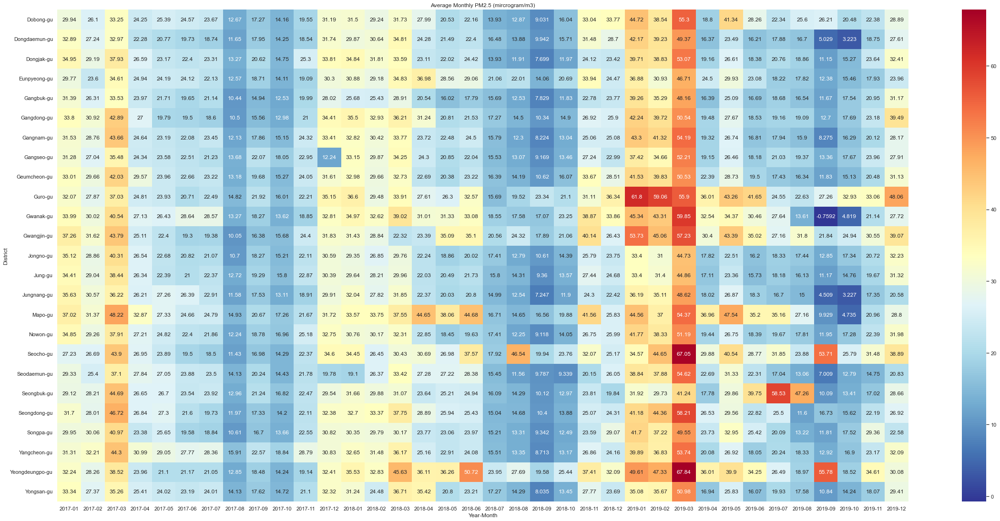

In [14]:
plt.figure(figsize = (40,19))
plt.title('Average Monthly PM2.5 (mircrogram/m3)')

sns.heatmap(df_pivot, annot=True, cmap='RdYlBu_r', fmt= '.4g',)
plt.xlabel('Year-Month')
plt.ylabel('District')
plt.show()

## Aplicar ángulos con un gráfico de radar

Podemos establecer el eje angular en el diagrama de dispersión en Plotly para crear un gráfico de radar interactivo. Cada mes se seleccionará como una variable en el círculo. Por ejemplo, en este artículo, crearemos un gráfico de radar que compare el promedio mensual de PM2.5 de los 25 distritos en 2019.

Filtre el DataFrame con solo datos de 2019

In [15]:
df_19 = df_monthly[df_monthly['Year']=='2019']

Crear gráfico de radar. Lo bueno de usar Plotly es que el gráfico de radar es interactivo. Entonces podemos filtrar fácilmente el gráfico.

In [16]:
import plotly.graph_objects as go

pal = list(sns.color_palette(palette='viridis', n_colors=len(list_scode)).as_hex())

months = list(reversed([str(i) for i in list(range(1,13))])) + ['12']
list_PM = [[list(df_19[df_19['District']==i]['PM2.5'])[int(n)-1] for n in months] for i in list_district]

fig = go.Figure()
for pm,d,c in zip(list_PM, list_district, pal):
    fig.add_trace(go.Scatterpolar(r = pm, theta=months, fill= None,
                                  name=str(d), marker = dict(color = c)))

fig.update_layout(polar = dict(radialaxis = dict(visible = True, range=[0, 70]),
                               angularaxis = dict(rotation=90)),
                  showlegend=True, width=720, height=720,
                  font = dict(size=14))

fig.show()

Vayamos más allá llenando el área de radar de cada uno de los distintos uno por uno y comparando cada uno con el resto. Luego crea un collage de fotos.

In [17]:
max_val = max(df_19['PM2.5'])*1.001        #set max value
pal = list(sns.color_palette(palette='YlOrRd', n_colors=len(list_district)).as_hex())

def circular_bar(input_df, column_name, title):
    plt.gcf().set_size_inches(12, 12)
    ax = plt.subplot(projection='polar')
    input_df.reset_index(inplace=True, drop=True)
    for i in range(len(input_df)):
        ax.barh(i, input_df[column_name][i]*2*np.pi/max_val, label=input_df['District'][i], color=pal[i])

    ax.set_theta_zero_location('N')
    ax.set_theta_direction(1)
    ax.set_rlabel_position(0)
    ax.set_thetagrids([], labels=[])
    ax.set_rgrids(range(len(input_df)), labels= input_df['District'])

    ax = plt.subplot(projection='polar')
    plt.title("Average PM2.5 // " + title)
    return ax

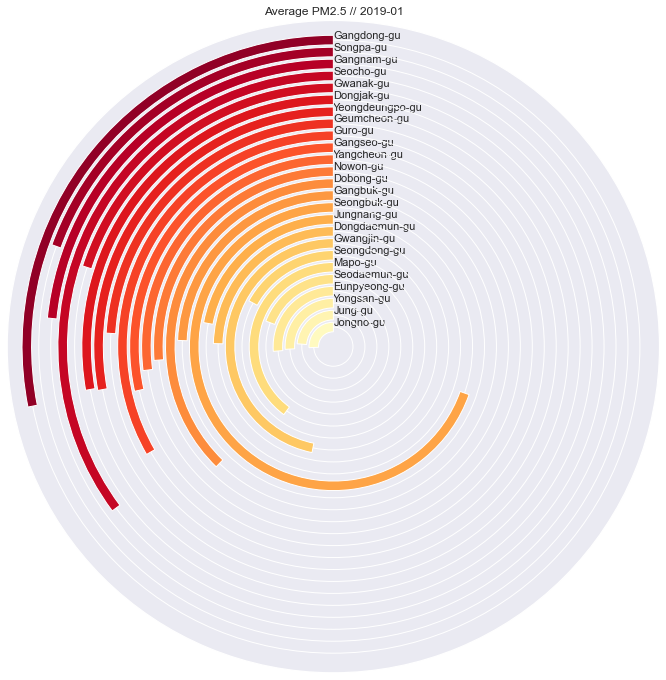

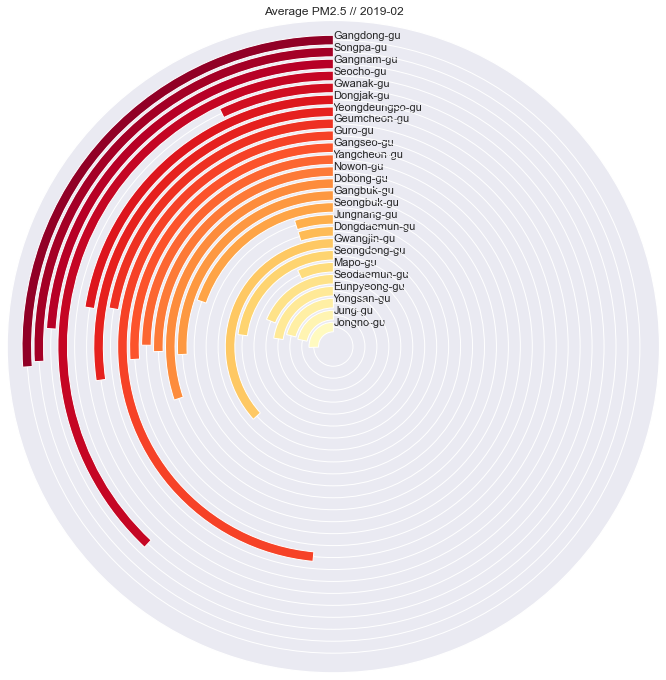

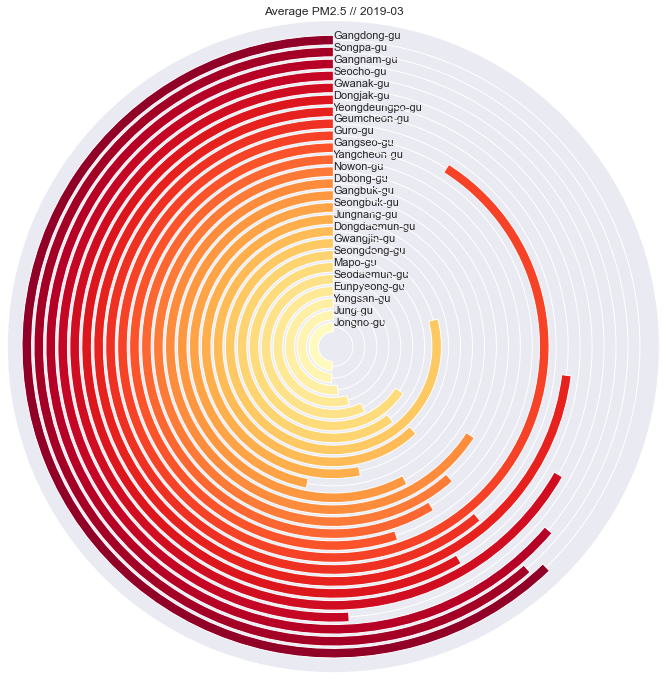

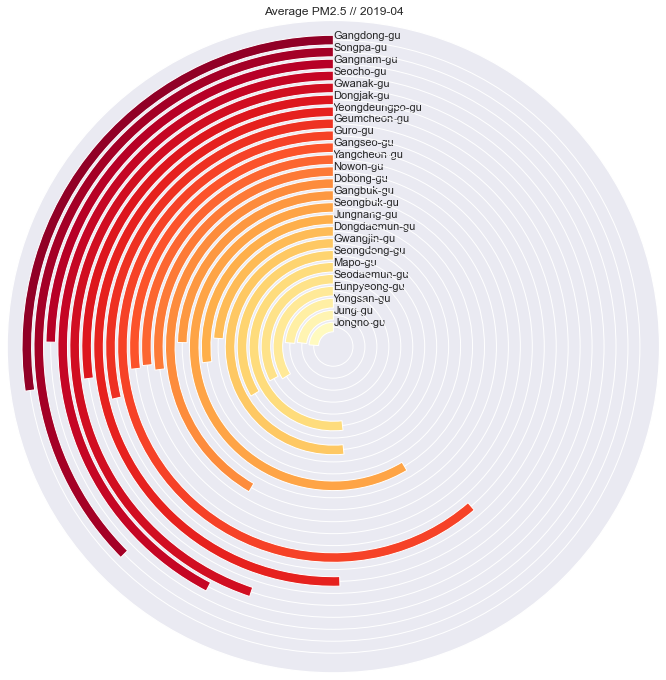

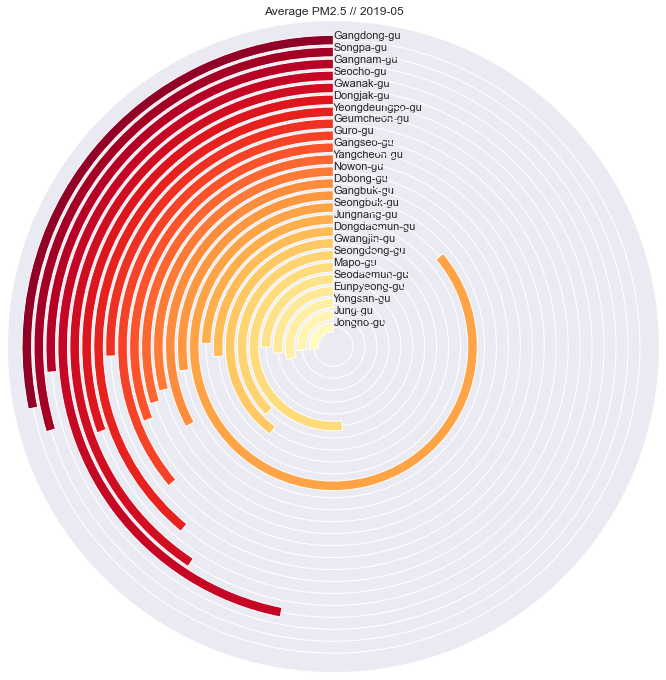

...

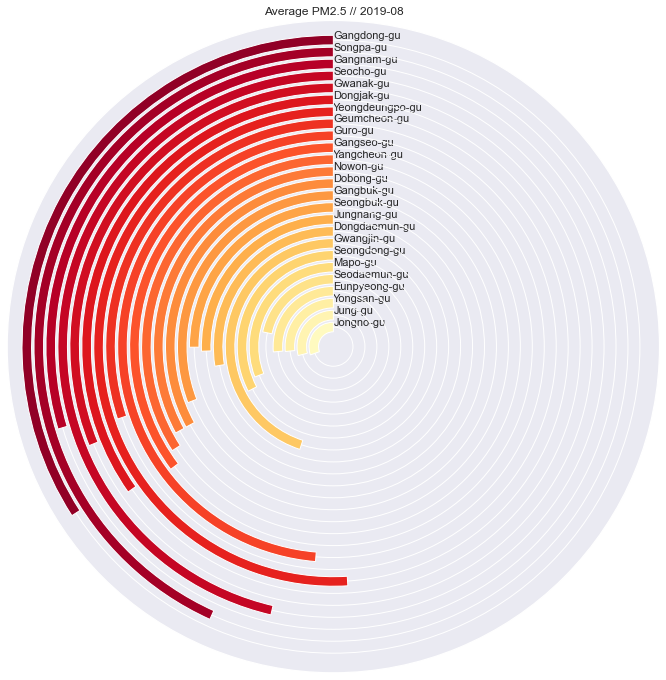

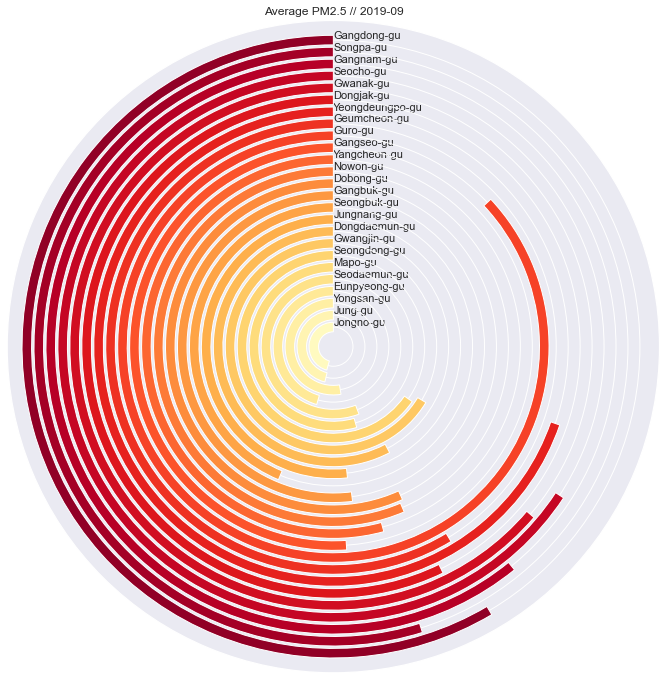

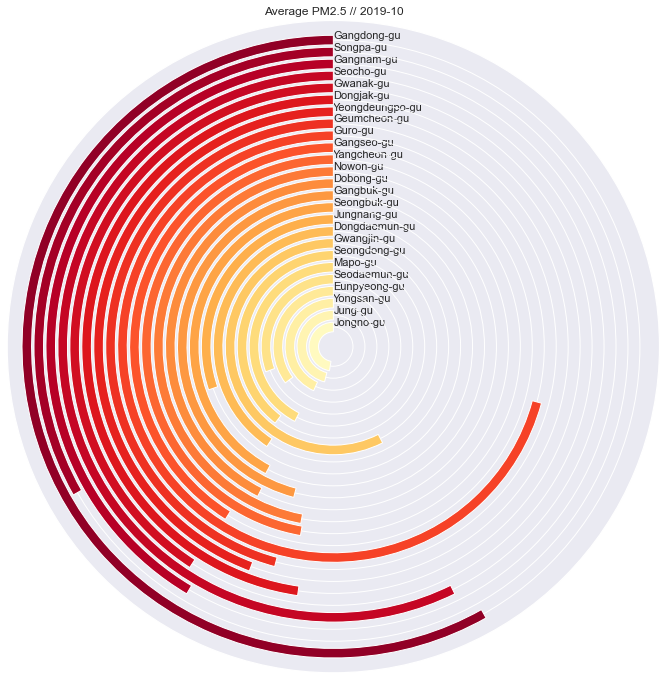

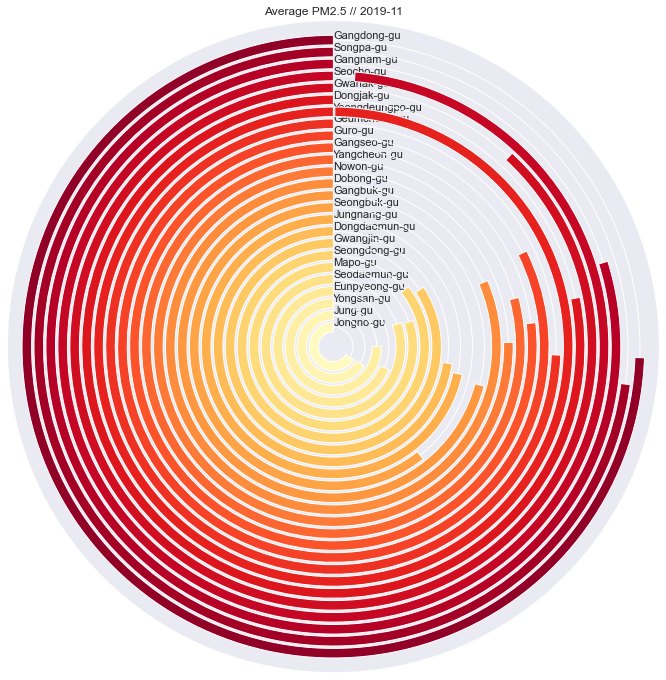

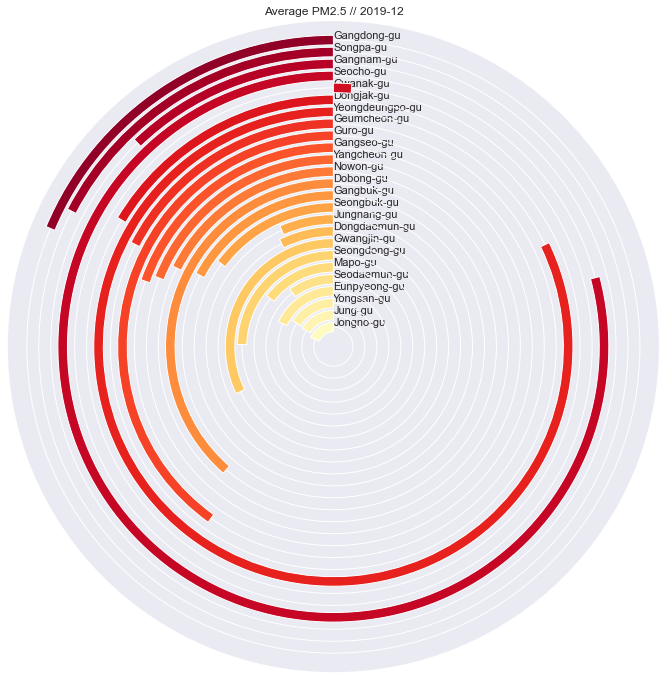

In [18]:
list_month19 = list(set(df_19['Month']))
list_YM19 = list(set(df_19['YM']))
list_YM19.sort()
listdf_monthly19 = [df_19[df_19['Month']==str(i)] for i in list_month19]

keep_sname = []
order = range(len(listdf_monthly19))
for i in order:
    circular_bar(listdf_monthly19[i],'PM2.5', list_YM19[i])
    keep_sname.append('cir_bar_' + str(i) + '.png')
    plt.savefig('cir_bar_' + str(i) + '.png')
    plt.show()

## Gráficos con Mapas

### plotly.express

In [19]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(df, x="sex", y="total_bill", color="smoker", barmode="group")
fig.show()

In [20]:
import plotly.express as px
df = px.data.gapminder().query("year==2007")
fig = px.scatter_geo(df, locations="iso_alpha", color="continent", hover_name="country", size="pop",
               projection="natural earth")
fig.show()

## Gráfico Dinámico

In [21]:
df = px.data.gapminder()
fig = px.scatter_geo(df, locations="iso_alpha", color="continent", hover_name="country", size="pop",
               animation_frame="year", projection="natural earth")
fig.show()

In [22]:
import plotly.express as px

df = px.data.gapminder().query("year==2007")
fig = px.sunburst(df, path=['continent', 'country'], values='pop',
                  color='lifeExp', hover_data=['iso_alpha'])
fig.show()

C:\Users\JuanMa\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\JuanMa\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



# Ejercicios

## 1. Comparar el nivel de contaminación del PM2.5 de los 25 distritos con una _pequeña serie de tiempo múltiple_ (Small Multiple Time Series).

Usando la libreria **Seaborn**, se pueden hacer _series temporales múltiples_. La idea detrás de estos gráficos es trazar cada línea una por una mientras las compara con la silueta de las otras líneas.

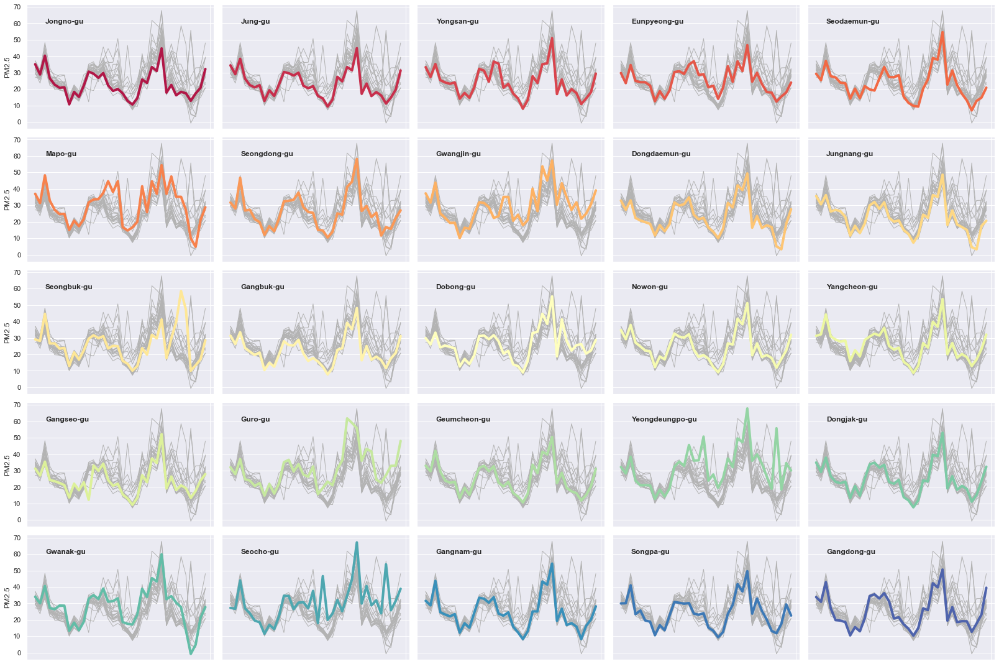

In [23]:
g = sns.relplot(data = df_monthly, x = "YM", y = "PM2.5",
                col = "District", hue = "District",
                kind = "line", palette = "Spectral",   
                linewidth = 4, zorder = 5,
                col_wrap = 5, height = 3, aspect = 1.5, legend = False
               )

for time, ax in g.axes_dict.items():
    ax.text(.1, .85, time,
            transform = ax.transAxes, fontweight="bold"
           )
    sns.lineplot(data = df_monthly, x = "YM", y = "PM2.5", units="District",
                 estimator = None, color= ".7", linewidth=1, ax=ax
                )

ax.set_xticks('')
g.set_titles("")
g.set_axis_labels("", "PM2.5")
g.tight_layout()

Todos los distritos muestran altos índices de contaminación de partículas PM2.5 durante el periodo 2017-2019. La mayoría muestra un comportamiento similar, pues estamos comparando los distritos de una misma ciudad que en general está gravemente contaminada. Sin embargo, cabe resaltar que los distritos de **Soungpa-gu** y **Gangbuk-gu** fueron los que en promedio pocas veces superaron la barrera de los 50 PM2.5, por otro lado, los distritos de **Yeongdeunpo-gu** y **Seocho-gu** fueron los que llegaron a picos más altos, superando los 60 PM2.5 e incluso llegando casi a 70 PM2.5.

## 2. ¿Cómo ha evolucionado el SO2 a lo largo de los años?

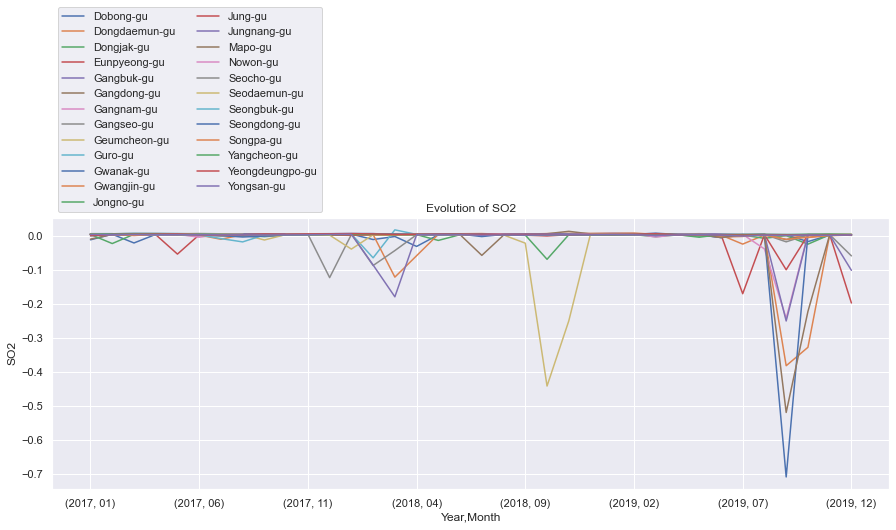

In [32]:
fig, ax = plt.subplots(figsize=(15,5))

df.groupby(['Year', 'Month', 'District']).mean()['SO2'].unstack().plot(ax=ax)
ax.set_ylabel("SO2")
ax.set_title("S02 Evolution")
ax.set_title("Evolution of SO2")
plt.legend(bbox_to_anchor=(0, 1), loc='lower left', ncol=2)
plt.grid(True)

Lo que a primera vista se puede analizar es que los niveles de $SO_{2}$ son muy bajos y en lo que se aprecia en el gráfico, en la mayoría de distritos los niveles se mantienen o no superan las 0.1 ppm en lo que respecta al 2017 y 2018, a partir del segundo semestre de 2019 los valores disminuyeron aún más. Podemos concluir que el SO2 promedio ha disminuido a lo largo de los años en los distritos de Seúl.

El Dióxido de Azufre es un gas muy tóxico para el ser humano que se origina sobre todo durante la combustión de carburantes fósiles que contienen azufre (petróleo, combustibles sólidos). 

Su disminución puede ser atribuida a que en los últimos años se ha producido un descenso acusado de las emisiones de SO2 producidas por la combustión en industrias de producción de energía debido a diversos factores que ha obligado a la introducción de tecnologías de desulfuración.

## 3. Densidades de PM2.5 de cada distrito durante los meses del 2019.

Esto se logra con un **gráfico de cresta (Ridge Plot)**. El gráfico de cresta muestra la distribución de un valor numérico para varios grupos. La distribución se puede representar mediante histogramas o diagramas de densidad, todos alineados en la misma escala horizontal y presentados con una ligera superposición.

Son diagramas de líneas parcialmente superpuestas que crean la impresión de una cadena montañosa. Pueden ser muy útiles para visualizar cambios en las distribuciones a lo largo del tiempo o el espacio. Funciona bien cuando hay un patrón claro en el resultado, como si hubiera una clasificación obvia en los grupos. De lo contrario, el grupo tenderá a superponerse entre sí, lo que dará lugar a una trama desordenada que no proporcionará ninguna información.

Para este caso, viene bien un gráfico de cresta, porque los resultados siguen este patron y porque hay un número significativo de grupos a mostrar.

In [33]:
pal = list(sns.color_palette(palette='viridis', n_colors=len(list_month19)).as_hex())

def kde_ridge(df_input, col_name, time, title):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

    g = sns.FacetGrid(df_input, row= time, hue=time, aspect=15, height=0.65, palette=pal)

    g.map(sns.kdeplot, col_name,
          bw_adjust=.5, clip_on=False,fill=True, alpha=1, linewidth=1.5)

    g.map(sns.kdeplot, col_name, clip_on=False, color="w", lw=2, bw_adjust=.5)

    g.map(plt.axhline, y=0, linewidth=2, linestyle="-", color=None, clip_on=False)
    
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .2, label, fontweight="bold", color=color,ha="left", va="center", transform=ax.transAxes)
    
    g.map(label, time)

    g.fig.subplots_adjust(hspace=-.25)

    g.set_titles("")
    g.set(yticks=[], ylabel="", xlabel= title + ' PM2.5')
    g.despine(bottom=True, left=True)

    return g

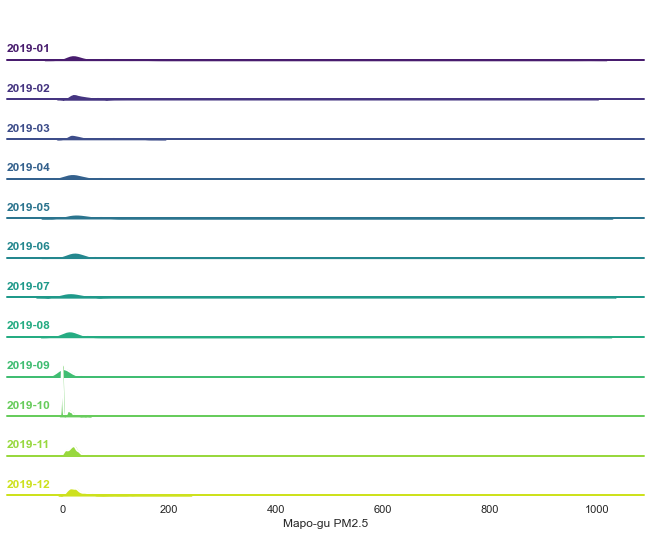

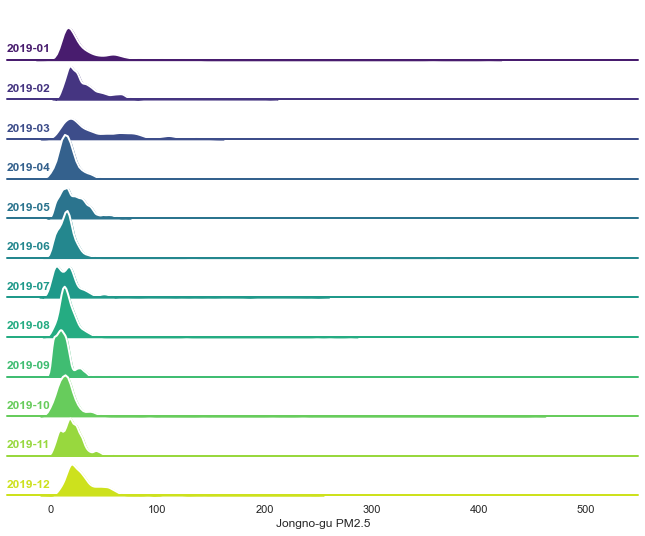

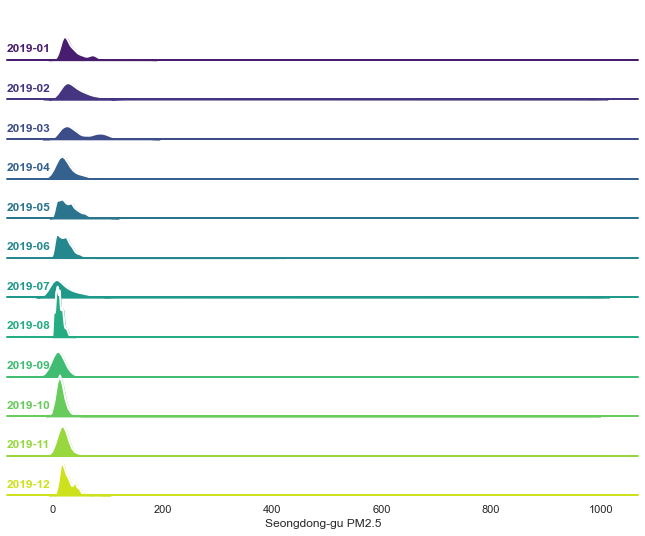

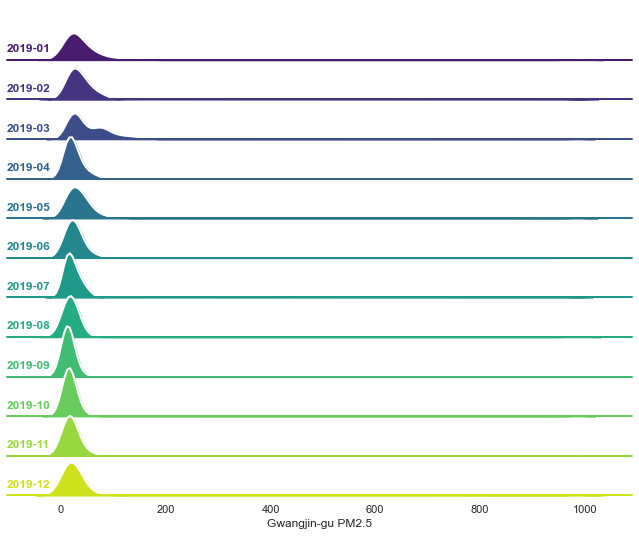

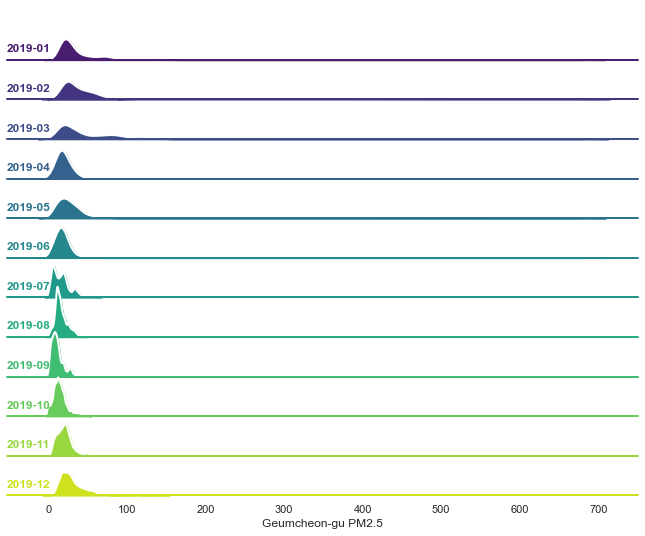

...

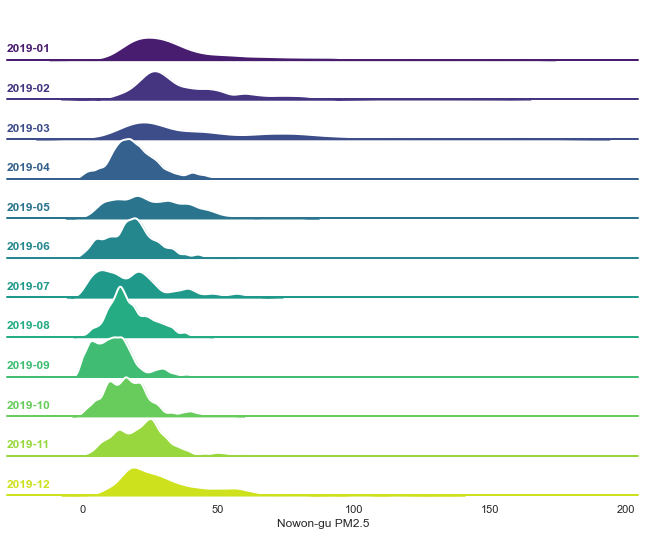

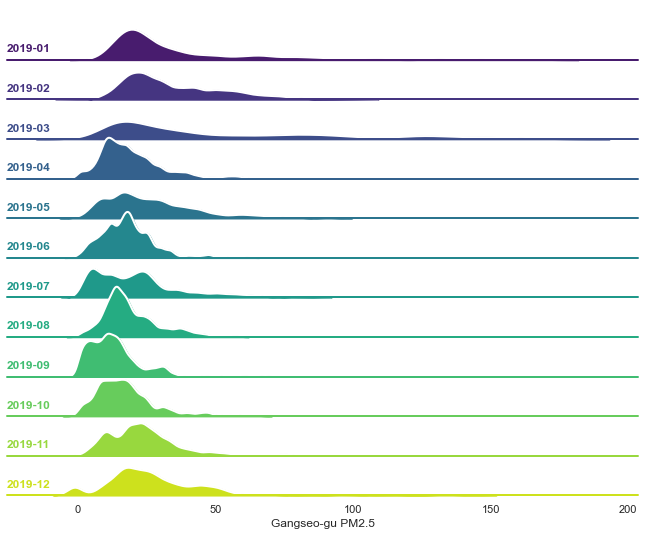

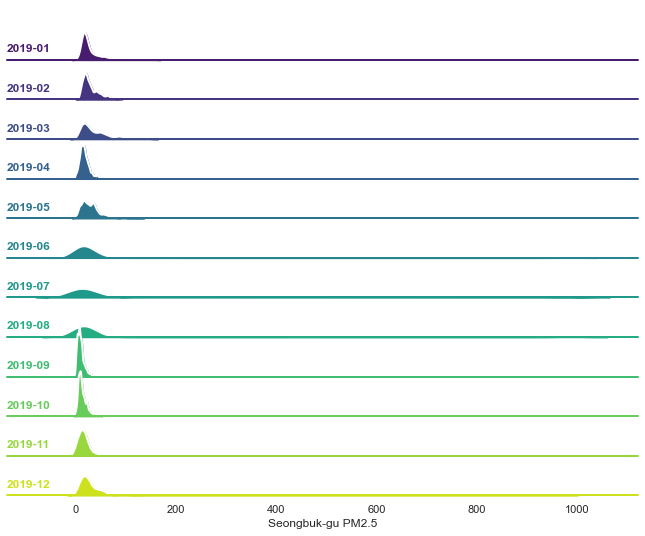

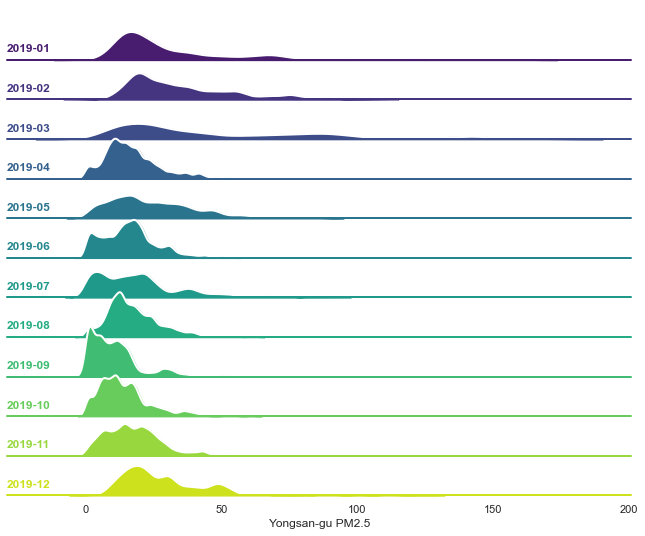

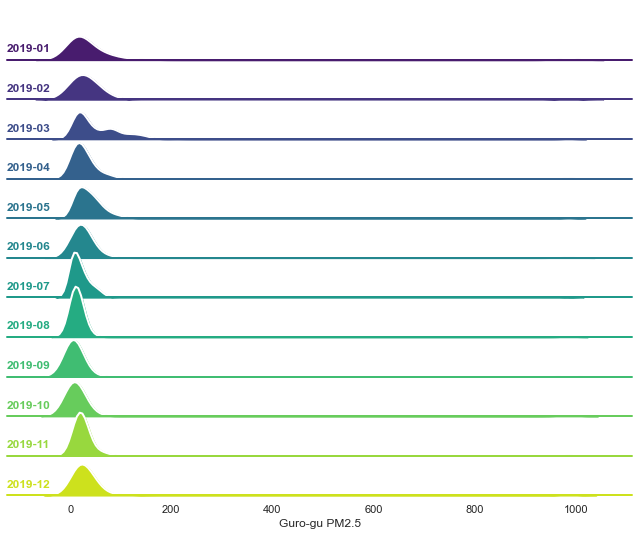

In [34]:
df_hour19 = df[df['Year']=='2019'] 
df_hd19 = [df_hour19[df_hour19['District']==i] for i in list_district]

keep_sname = []
order = range(len(list_district))
for i in order:
    kde_ridge(df_hd19[i], 'PM2.5', 'YM', list_district[i])
    keep_sname.append('kde_' + str(i) + '.png')
    plt.savefig('kde_' + str(i) + '.png')
    plt.show()

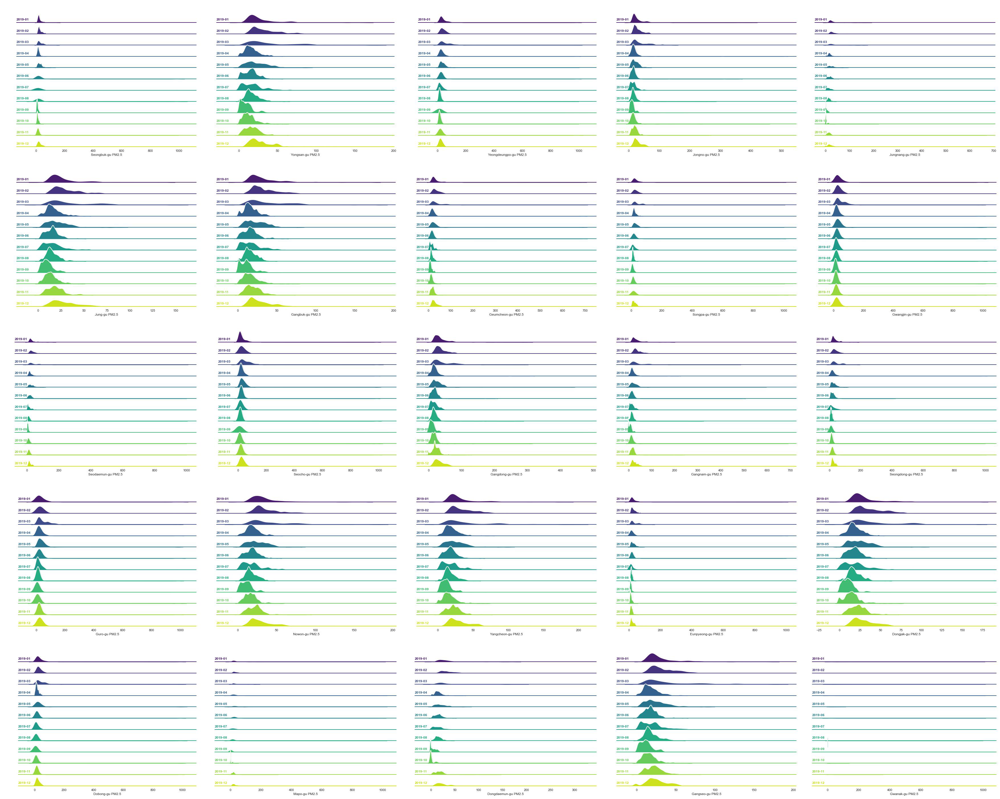

In [35]:
import IPython.display as display
from PIL import Image

display.display(Image.open('Collage_kde_ridge.jpg'))

Los distritos menos contaminados en el año 2019 fueron Seongbuk-gu, Seodaemun-gu, Mapo-gu  y Jungnang-gu, los cuales estuvieron por debajo de los 20 PM 2.5 durante todo el año.

Distritos como Dobong-gu, Guro-gu, Yeongdeungpo-gu y Gwangjin-gu tuvieron casi los mismos niveles de contaminación por PM2.5 durante todo el año, de los 25 distritos fueron los que no se excedieron de los 20 PM2.5 aproximadamente.

Los distritos más contaminados en el año 2019 fueron Dongjak-gu, Gangbuk-gu y Jung-gu, los cuales en promedio registraron medidas entre los 15 y 30 PM2.5 pero llegaron a registrar, en menor frecuencia, niveles de hasta 70 PM2.5.

Los distritos restantes tuvieron niveles promedio, entre los 30 y 40 PM2.5, no llegaron al límite de los 60 PM2.5 pero tampoco bajaron de los 20.

En general, un patrón que se repitió en todos los distritos es que el los meses de Agosto, Septiembre y Octubre, el nivel de partículas era densamente el mismo a lo largo del mes, es decir, el registro de PM2.5 fue el mismo en casi todo el mes, lo que explica los picos más inclinados y densos.

## 4. Correlaciones entre variables contaminantes.

El propósito ver cómo se relacionan las variables contaminantes entre sí (análisis de correlación). Pero las variables contaminantes tienen diferentes escalas.

La correlación se normaliza por desviación estándar. Por lo tanto, no es necesario normalizarlos. Por definición, el coeficiente de correlación es independiente del cambio de origen y escala. Como tal, la estandarización no alterará el valor de la correlación.

In [36]:
measurement_info = pd.read_csv('Measurement_info.csv')
measurement_info_clean = measurement_info.loc[measurement_info['Instrument status'] == 0]
measurement_info_clean.shape

(3775778, 5)

In [37]:
item_info = pd.read_csv('Measurement_item_info.csv')
print(item_info.shape)
print(item_info.dtypes)
item_info

(6, 7)
Item code                int64
Item name               object
Unit of measurement     object
Good(Blue)             float64
Normal(Green)          float64
Bad(Yellow)            float64
Very bad(Red)          float64
dtype: object


,Item code,Item name,Unit of measurement,Good(Blue),Normal(Green),Bad(Yellow),Very bad(Red)
0,1,SO2,ppm,0.02,0.05,0.15,1.0
1,3,NO2,ppm,0.03,0.06,0.20,2.0
2,5,CO,ppm,2.00,9.00,15.00,50.0
3,6,O3,ppm,0.03,0.09,0.15,0.5
4,8,PM10,Mircrogram/m3,30.00,80.00,150.00,600.0
5,9,PM2.5,Mircrogram/m3,15.00,35.00,75.00,500.0


In [38]:
item_code = item_info['Item code'].tolist()
item_name = item_info['Item name'].tolist()


item_dict = { k:v for (k,v) in zip(item_code, item_name)}
print(item_dict)

{1: 'SO2', 3: 'NO2', 5: 'CO', 6: 'O3', 8: 'PM10', 9: 'PM2.5'}


In [39]:
so2 = measurement_info_clean.loc[measurement_info_clean['Item code'] == 1]
no2 = measurement_info_clean.loc[measurement_info_clean['Item code'] == 3]
co = measurement_info_clean.loc[measurement_info_clean['Item code'] == 5]
o3 = measurement_info_clean.loc[measurement_info_clean['Item code'] == 6]
pm10 = measurement_info_clean.loc[measurement_info_clean['Item code'] == 8]
pm25 = measurement_info_clean.loc[measurement_info_clean['Item code'] == 9]

co_groupbydates = co.groupby("Measurement date")["Average value"].mean()
so2_groupbydates = so2.groupby("Measurement date")["Average value"].mean()
o3_groupbydates = o3.groupby("Measurement date")["Average value"].mean()
no2_groupbydates = no2.groupby("Measurement date")["Average value"].mean()
pm10_groupbydates = pm10.groupby("Measurement date")["Average value"].mean()
pm25_groupbydates = pm25.groupby("Measurement date")["Average value"].mean()

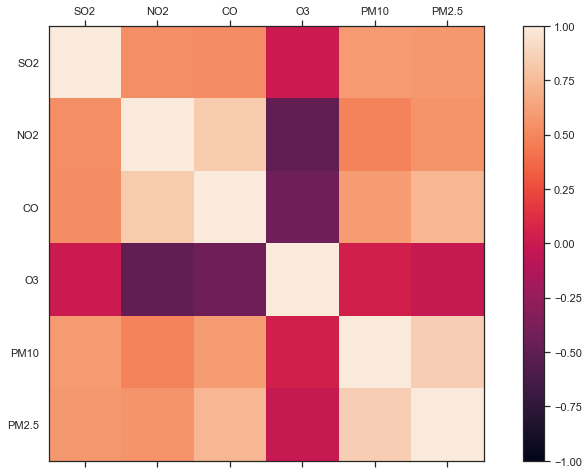

In [40]:
from pandas import concat

horizontal_concat = concat([so2_groupbydates, no2_groupbydates, co_groupbydates, o3_groupbydates, pm10_groupbydates, pm25_groupbydates], axis=1)
correlations = horizontal_concat.corr() 
# plot correlation matrix 
fig = plt.figure() 
ax = fig.add_subplot(111) 
cax = ax.matshow(correlations, vmin=-1, vmax=1) 
fig.colorbar(cax)
ticks = np.arange(0, len(item_name))
ax.set_xticks(ticks) 
ax.set_yticks(ticks) 
ax.set_xticklabels(item_name) 
ax.set_yticklabels(item_name)
plt.grid(False)
plt.show()

Hay variables altamente relacionadas de la siguiente manera:

- SO2 y NO2 (0,86)
- SO2 y O3 (0,84)
- PM2.5 y CO (0.75)
- PM2.5 y PM10 (0.81)

SO2, NO2 podrían tener una fuerte correlación entre si por el bajo nivel que registraron durante cada mes de cada año, son dos agentes contaminantes muy toxicos, pero afortunadamente poco presentes en el aire del planeta.

SO2 y O3 tienen un caso parecido al anterior, con la diferencia de que el Ozono (O3) es aún más escaso y menos tóxico que el NO2.

PM2.5 y CO tienen una correlación no tan alta, pero si algo obvia, pues en cuanto a valores no son muy parecidos, además de que tienen diferentes medidas, pero los dos tienden a aumentar en el mismo porcentaje, pues los dos son agentes contaminantes que provienen principalmente de la combustión de como la de los automóviles, camiones, fábricas, quemas de madera, quemas agrícolas y otras actividades.

PM2.5 y PM10, partículas en suspensión menores a 2.5 micras y 10 micras respectivamente. Las PM2.5 se originan por la combustión de automóviles, fábricas, madera, etc. Las PM10 son formadas principalmente por compuestos inorgánicos como silicatos y aluminatos, metales pesados, entre otros, y material orgánico asociado a partículas de carbono. Los factores que los originan son producto de las actividades más contaminantes y más demandadas: la producción de combustibles, fabricación de material de construcción, la industria farmacéutica entre otras.

## 5. Promedio del contaminante PM2.5 en 2019 con Gráficos Radiales.

In [41]:
pal = list(sns.color_palette(palette='CMRmap_r', n_colors=len(list_district)).as_hex())
lowerLimit = 0
max_v = df_19['PM2.5'].max()

def radial_plot(input_df, column_name, title):
    input_df.reset_index(inplace=True, drop=True)
    plt.figure(figsize=(12,12))
    ax = plt.subplot(111, polar=True)
    plt.axis()
    
    heights = input_df[column_name]
    width = 2*np.pi / len(input_df.index)

    indexes = list(range(1, len(input_df.index)+1))
    angles = [element * width for element in indexes]

    bars = ax.bar(x=angles, height=heights, width=width, bottom=lowerLimit,
                  linewidth=1, edgecolor="white", color=pal)
    
    labelPadding = 2

    for bar, angle, height, label in zip(bars, angles, heights, list_district):
        rotation = np.rad2deg(angle)
        alignment = ""
      
        if angle >= np.pi/2 and angle < 3*np.pi/2:
            alignment = "right"
            rotation = rotation + 180
        else: 
            alignment = "left"

        ax.text(x=angle, y=lowerLimit + bar.get_height() + labelPadding,
                s=label, ha=alignment, va='center', rotation=rotation, 
                rotation_mode="anchor")
    
        ax.set_thetagrids([], labels=[])
        plt.title("Average PM2.5 // " + title)
    return ax

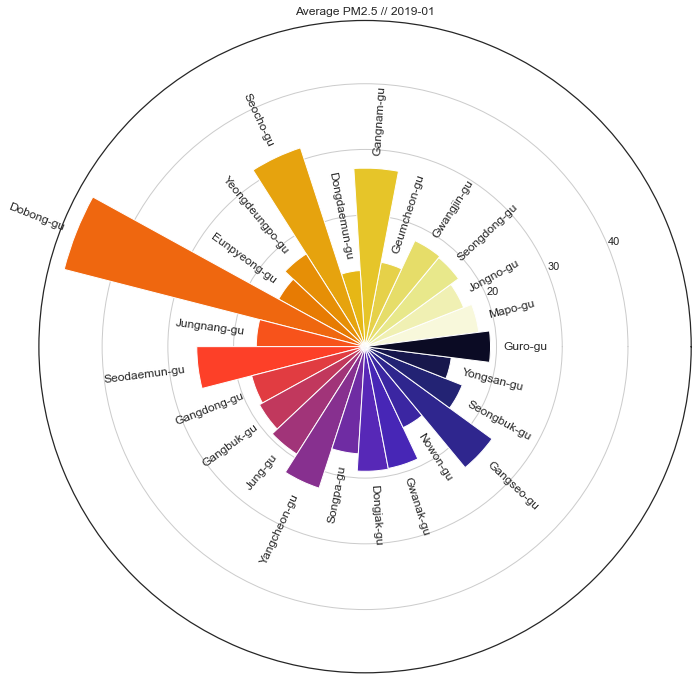

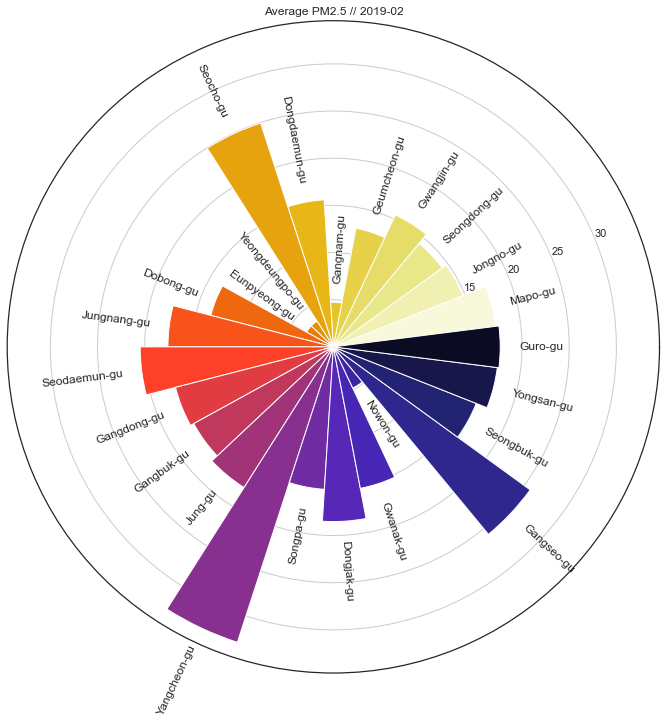

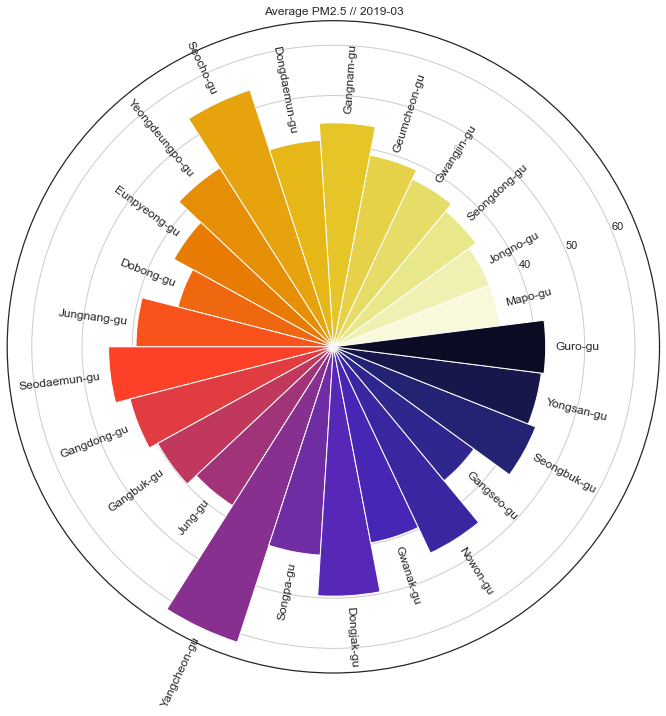

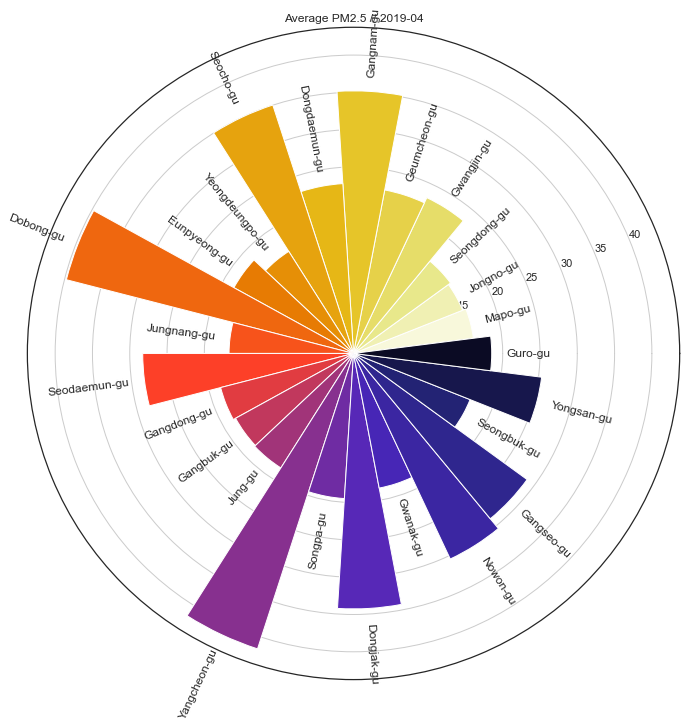

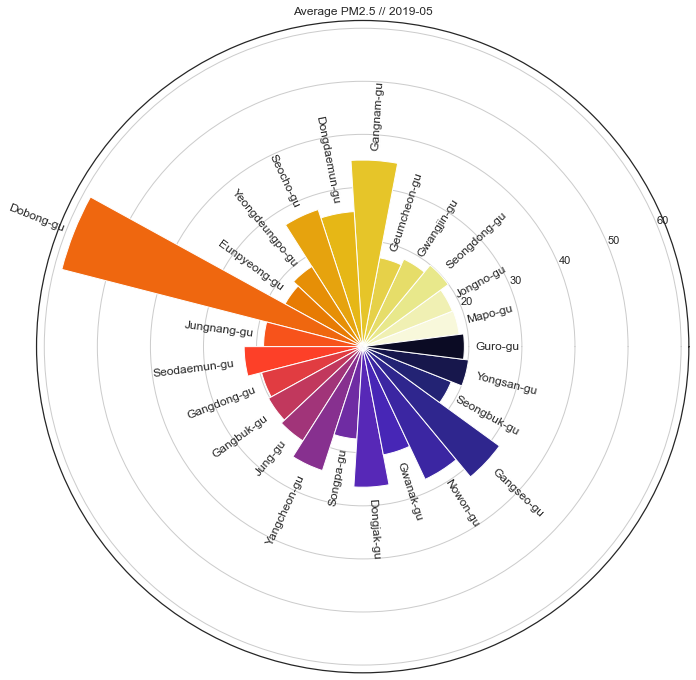

...

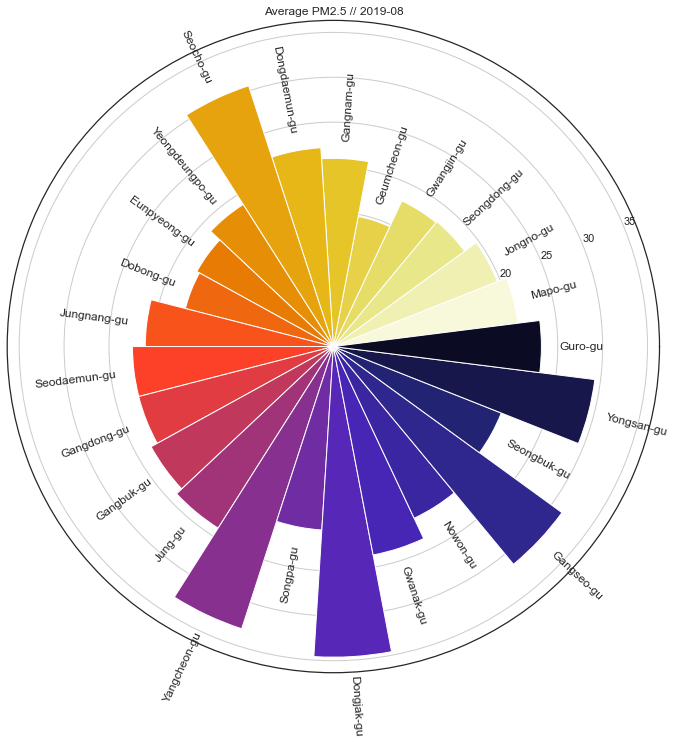

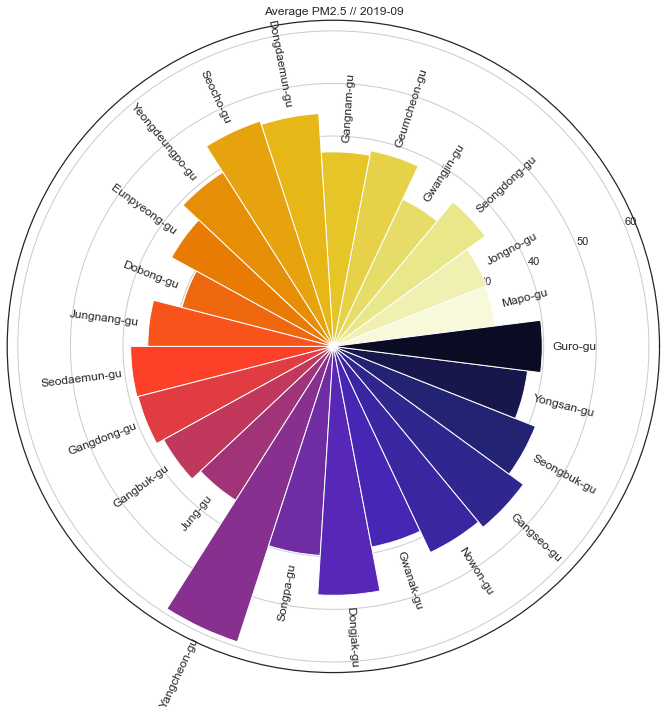

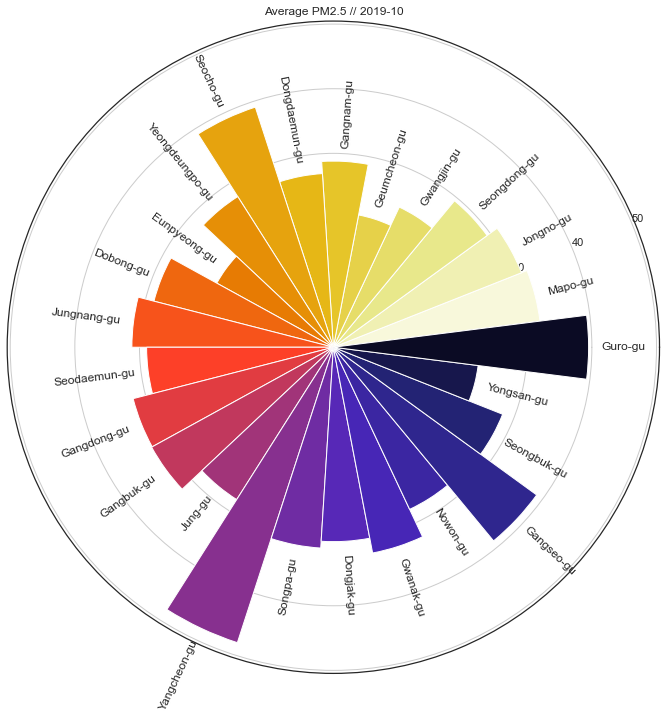

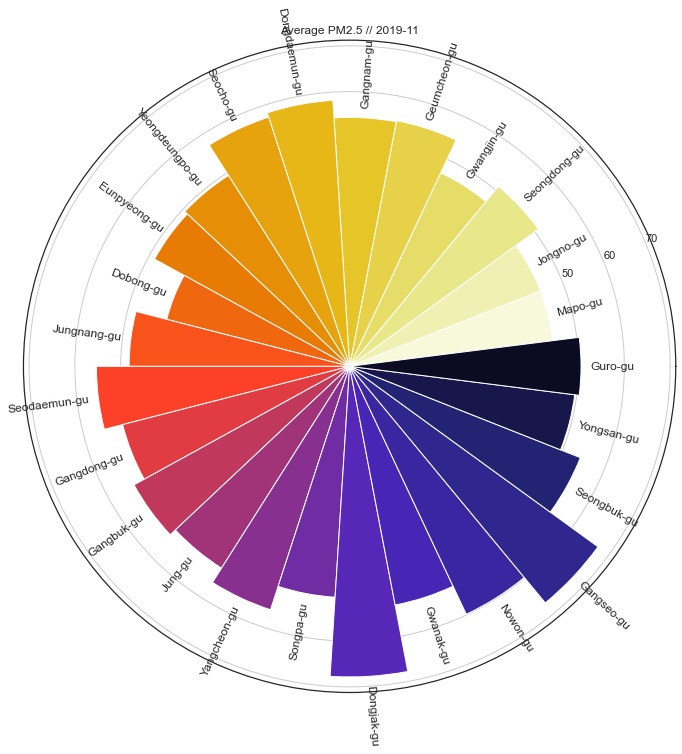

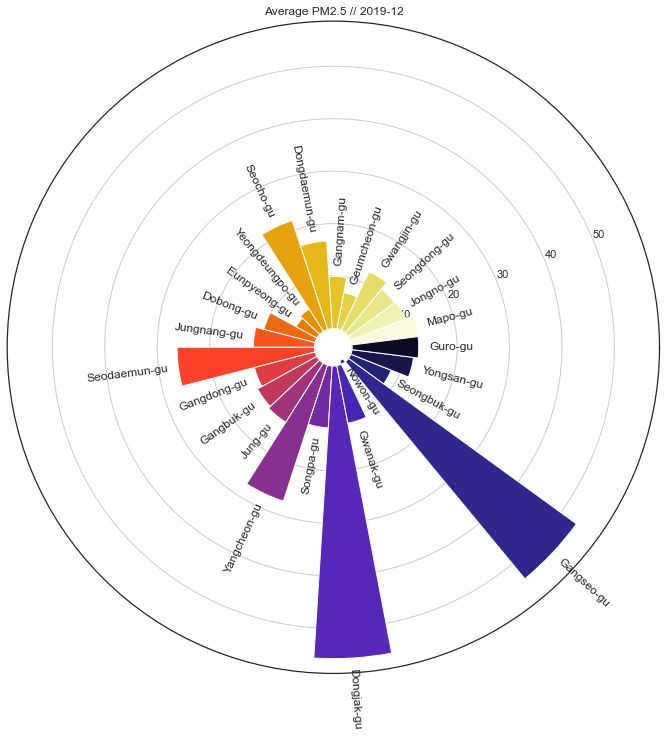

In [42]:
keep_sname = []
order = range(len(listdf_monthly19))

for i in order:
    radial_plot(listdf_monthly19[i], 'PM2.5', list_YM19[i])
    keep_sname.append('rad_bar_' + str(i) + '.png')
    plt.savefig('rad_bar_' + str(i) + '.png')
    plt.show()

Los resultados son interesantes. En marzo, la mayoría de los distritos mostraron bajos niveles de contaminación por PM2.5, el único distrito que con diferencia excede los límites fue **Yeongdeungpo-gu** llegando casi a 50 PM2.5 y **Gwangjin-gu** llegando casi a 60 PM2.5, mientras que los otros apenas estaban entre los 20 PM2.5 y los 30 PM2.5. El mismo patrón se repitió en abril. En Julio, sucedió algo similar, los la mayoría de los distritos tuvieron niveles bajos de PM2.5 (entre 10 y 30), a diferencia de dos distritos, **Eunpyeong-gu** y **Gwangjin-gu** que sobrepasaron los 50 PM2.5.

Ahora bien, en el mes de Septiembre registraron los niveles más elevados en todos los distritos y en general fue el mes más contaminado de todos, siendo el caso de algunos distritos que casi tocan la barrera de los 70 PM2.5.

El resto de distritos no mencionados tuvieron unos niveles de contaminación casi que iguales durante los últimos 12 meses.